In [1]:
import json
import matplotlib.pyplot as plt
import os
import numpy as np
from sklearn.linear_model import LinearRegression
import re 
import pandas as pd


In [ ]:
def get_data_from_stats_json (filename):
    """
        Takes a .json file, gets from the json-objects in it certain interesting values 
        and processes them for further analysis. 
    """
    with open (filename, 'r') as file:
        data = json.load(file)

    container_output = data.get("containerOutput")
    cpu_nano = [out.get("Stats")[0].get("CPUNano") for out in container_output]
    cpu_system_nano = [out.get("Stats")[0].get("CPUSystemNano") for out in container_output]
    cpu_nano_diffs = [(cpu_nano[i] - cpu_nano[i-1])/1e9 for i in range(1, len(cpu_nano))]
    cpu_system_nano_diffs = [(cpu_system_nano[i] - cpu_system_nano[i-1])/1e9 for i in range(1, len(cpu_system_nano))]
    cpu_percentage = [100 * cpu/30 for cpu in cpu_nano_diffs]
    initial_time = 0
    timing = [initial_time + i * 30 for i in range(len(cpu_nano_diffs))]
    network = data.get("network")

    return {
        "container_output" : container_output, 
        "network" : network, 
        "cpu_nano_diffs" : cpu_nano_diffs, 
        "cpu_system_nano_diffs": cpu_system_nano_diffs,
        "cpu_percentage" : cpu_percentage, 
        "timing" : timing
    } 



In [3]:
def make_a_plot(lines, x_axis_label, y_axis_label, title):
    """
        Takes lines and plots them with on the x-axis and y-axis the given label
        and having the given title.
    """
    for (x_data, y_data, data_label, color) in lines:
        if data_label is not None:
            plt.plot(x_data, y_data, label=data_label, color=color)
        else:
            plt.plot(x_data, y_data)
    plt.xlabel(x_axis_label)
    plt.ylabel(y_axis_label)
    plt.title(title)
    plt.legend(bbox_to_anchor=(1, 0.5), loc='center left')
    plt.savefig('graphs/' + title+'.svg', bbox_inches="tight")
    plt.figure(dpi=1200) 
    plt.show()

# Automated analysis results
*Focusing on the CPU usage*

In [4]:
def make_list_of_outputs(directory):
    """
        Take all files that are in directory `directory`, parse 
        the json stored in each file and add then to the right 
        dictionary list, corresponding to the TCP percentage
    """
    files = os.listdir(directory)
    parsed_0 = []
    parsed_10 = []
    parsed_20 = []
    parsed_30 = []
    parsed_40 = []
    parsed_50 = []
    parsed_60 = []
    parsed_70 = []
    parsed_80 = []
    parsed_90 = []
    parsed_100 = []
    parsed_110 = []
    for filename in files:
        if not filename.endswith(".json"): # skip the files that are not json
            continue
        parsed_output =  get_data_from_stats_json(directory + '/' + filename)
        percentage = filename.split('_')[0]
        parsed_output['tcp_percentage'] = percentage
        if percentage == '0':
            parsed_0.append(parsed_output)
        elif percentage == '10': 
            parsed_10.append(parsed_output)
        elif percentage == '20': 
            parsed_20.append(parsed_output)
        elif percentage == '30': 
            parsed_30.append(parsed_output)
        elif percentage == '40': 
            parsed_40.append(parsed_output)
        elif percentage == '50': 
            parsed_50.append(parsed_output)
        elif percentage == '60': 
            parsed_60.append(parsed_output)
        elif percentage == '70': 
            parsed_70.append(parsed_output)
        elif percentage == '80': 
            parsed_80.append(parsed_output)
        elif percentage == '90': 
            parsed_90.append(parsed_output)
        elif percentage == '100':
            parsed_100.append(parsed_output)
        elif percentage == '110':
            parsed_110.append(parsed_output)
    return parsed_110, parsed_100, parsed_90, parsed_80, parsed_70, parsed_60, parsed_50, parsed_40, parsed_30, parsed_20, parsed_10, parsed_0

In [5]:
# Getting the average for a given output list
def average_parsed_output(output_list):
    """
        Given output_list (a list of dictionaries containing the json output file) we compute 
        the average over the different lists of the 'cpu_nano_diffs' and the 'cpu_system_nano_diffs'
        entries and return these
    """
    cpu_duration_to_average = [d['cpu_nano_diffs'] for d in output_list]
    if not all(len(cpu_duration_list) == len(cpu_duration_to_average[0]) for cpu_duration_list in cpu_duration_to_average):
        print("Not all of the lists in the cpu_duration_to_average list of lists are the same length.")
        print([len(cpu_dur_list) for cpu_dur_list in cpu_duration_to_average])
        print("TODO: this needs to be fixed")
        return None
    avg_cpu_duration = [sum(values)/len(values) for values in zip(*cpu_duration_to_average)]
    
    sys_cpu_duration_to_average = [d['cpu_system_nano_diffs'] for d in output_list]
    if not all(len(sys_cpu_duration_list) == len(sys_cpu_duration_to_average[0]) for sys_cpu_duration_list in sys_cpu_duration_to_average):
        print("Not all of the lists in the cpu_duration_to_average list of lists are the same length.")
        print(sys_cpu_duration_to_average)
        print("TODO: this needs to be fixed")
        return None
    avg_sys_cpu_duration = [sum(values)/len(values) for values in zip(*sys_cpu_duration_to_average)]

    cpu_percentage_to_average = [d['cpu_percentage'] for d in output_list]
    if not all(len(cpu_percentage) == len(cpu_percentage_to_average[0]) for cpu_percentage in cpu_percentage_to_average):
        print("Not all of the lists in the cpu_duration_to_average list of lists are the same length.")
        print(cpu_percentage_to_average)
        print("TODO: this needs to be fixed")
        return None
    avg_cpu_percentage = [sum(values)/len(values) for values in zip(*cpu_percentage_to_average)]
    
    return avg_cpu_duration, avg_sys_cpu_duration, avg_cpu_percentage

In [6]:
# ONLY FOR VERBOSE PLOTTING WITH ALL LINES PLOTTED 
def add_parsed_to_plotter(parsed, plotter_cpu, plotter_sys_cpu, plotter_percentage_cpu, color):
    """ 
        Takes the parsed dictionary and a list of plotting tuples and adds 
        the right information to the lists such that we can plot 
        the values in the dictionary
    """
    avg_cpu, avg_sys_cpu, avg_cpu_percentage = average_parsed_output(parsed)
    for i, output in enumerate(parsed):
        plotter_cpu.append((output['timing'], output['cpu_nano_diffs'], None, None))
        plotter_sys_cpu.append((output['timing'], output['cpu_system_nano_diffs'], None, None))
        plotter_percentage_cpu.append((output['timing'], output['cpu_percentage'], None, None))
    plotter_cpu.append((parsed[0]['timing'], avg_cpu, f"Avg for {parsed[0]['tcp_percentage']}% TCP", color))
    plotter_sys_cpu.append((parsed[0]['timing'], avg_sys_cpu, f"Avg for {parsed[0]['tcp_percentage']}% TCP", color))
    plotter_percentage_cpu.append((parsed[0]['timing'], avg_cpu_percentage, f"Avg percentage of CPU for {parsed[0]['tcp_percentage']}% TCP", color))


In [7]:
# FOR ONLY PLOTTING THE AVERAGE 
def add_avg_parsed_to_plotter(parsed, plotter_cpu, plotter_sys_cpu, plotter_percentage_cpu, color):
    """
        Puts the average CPU usages from parsed on normal and on system level 
        into the right plotter arrays so that these can be plotted
    """
    avg_cpu, avg_sys_cpu, avg_cpu_percentage = average_parsed_output(parsed)
    plotter_cpu.append((parsed[0]['timing'], avg_cpu, f"{parsed[0]['tcp_percentage']}% TCP", color))
    plotter_sys_cpu.append((parsed[0]['timing'], avg_sys_cpu, f"{parsed[0]['tcp_percentage']}% TCP", color))
    plotter_percentage_cpu.append((parsed[0]['timing'], avg_cpu_percentage, f"{parsed[0]['tcp_percentage']}% TCP", color))


In [8]:
def make_cpu_over_time_plots(directory):
    parsed_outputs = make_list_of_outputs(directory)

    to_plot_cpu = []
    to_plot_sys_cpu = []
    to_plot_cpu_avg = []
    to_plot_cpu_sys_avg = []
    to_plot_percentage_cpu = []
    to_plot_percentage_cpu_avg = []

    colors = plt.cm.viridis(np.linspace(0, 1, len(parsed_outputs)))

    for i, output in enumerate(parsed_outputs):
        add_parsed_to_plotter(output, to_plot_cpu, to_plot_sys_cpu, to_plot_percentage_cpu, colors[i])
        add_avg_parsed_to_plotter(output, to_plot_cpu_avg, to_plot_cpu_sys_avg, to_plot_percentage_cpu_avg, colors[i])


    make_a_plot(to_plot_cpu, "Elapsed time (s)", "Userspace CPU time per 30 seconds (s)", "Userspace CPU usage over time")
    make_a_plot(to_plot_sys_cpu, "Elapsed time (s)", "Kernel CPU time per 30 seconds (s)", "Kernel CPU usage over time")
    make_a_plot(to_plot_cpu_avg, "Elapsed time (s)", "Userspace CPU time per 30 seconds (s)", "Average userspace CPU usage over time")
    make_a_plot(to_plot_cpu_sys_avg, "Elapsed time (s)", "Kernel CPU time per 30 seconds (s)", "Average kernel CPU usage over time")
    make_a_plot(to_plot_percentage_cpu, "Elapsed time (s)", "Userspace CPU utilization (%)", "Userspace relative CPU utilization over time")
    make_a_plot(to_plot_percentage_cpu_avg, "Elapsed time (s)", "Userspace CPU utilization (%)", "Average userspace CPU utilization over time")

In [24]:
def make_cpu_overtime_software_overview(directories):
    list_of_to_plot_cpu_avgs = []
    for directory in directories:
        parsed_outputs = make_list_of_outputs(directory)

        to_plot_cpu = []
        to_plot_sys_cpu = []
        to_plot_cpu_avg = []
        to_plot_cpu_sys_avg = []
        to_plot_percentage_cpu = []
        to_plot_percentage_cpu_avg = []

        colors = plt.cm.viridis(np.linspace(0, 1, len(parsed_outputs)))

        for i, output in enumerate(parsed_outputs):
            add_parsed_to_plotter(output, to_plot_cpu, to_plot_sys_cpu, to_plot_percentage_cpu, colors[i])
            add_avg_parsed_to_plotter(output, to_plot_cpu_avg, to_plot_cpu_sys_avg, to_plot_percentage_cpu_avg, colors[i])
        list_of_to_plot_cpu_avgs.append((to_plot_cpu_avg, directory.removeprefix("stats-output/")))
    
    fig, axs = plt.subplots(2, 2, sharey=True, figsize=(13, 10))  
    axs = axs.flatten()

    i = 0
    handles = []
    for lines, graph in list_of_to_plot_cpu_avgs:
        if graph == 'nsd':
            axs[i].set_title('NSD')
        elif graph == 'knot':
            axs[i].set_title('Knot')
        elif graph == 'bind':
            axs[i].set_title('BIND')
        else:
            axs[i].set_title("PowerDNS (in BIND mode)")
        axs[i].set_ylabel("Userspace CPU time per 30 seconds (s)")
        axs[i].set_xlabel("Elapsed time (s)")
        for line in lines:
            if i == 0:
                label = line[2]
                if label == '110% TCP':
                    label = 'Only TCP'
                    handle, = axs[i].plot(line[0], line[1], linestyle='dashed', color='red', label=label)
                else:
                    handle, = axs[i].plot(line[0], line[1], color=line[3], label=label)
                handles.append(handle)
            else:
                if line[2] == '110% TCP':
                    axs[i].plot(line[0], line[1],  linestyle = 'dashed', color='red')
                else:
                    axs[i].plot(line[0], line[1],color=line[3])
        i += 1
    # fig.suptitle('CPU usage over time for each name server software', fontsize=19)
    fig.legend(handles=handles, bbox_to_anchor=(1, 0.5), loc='center left')

    plt.tight_layout(pad=1.5)
    # plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for legend
    plt.savefig('graphs/cpu_over_time_overview.svg', bbox_inches="tight")
    plt.show()  
    


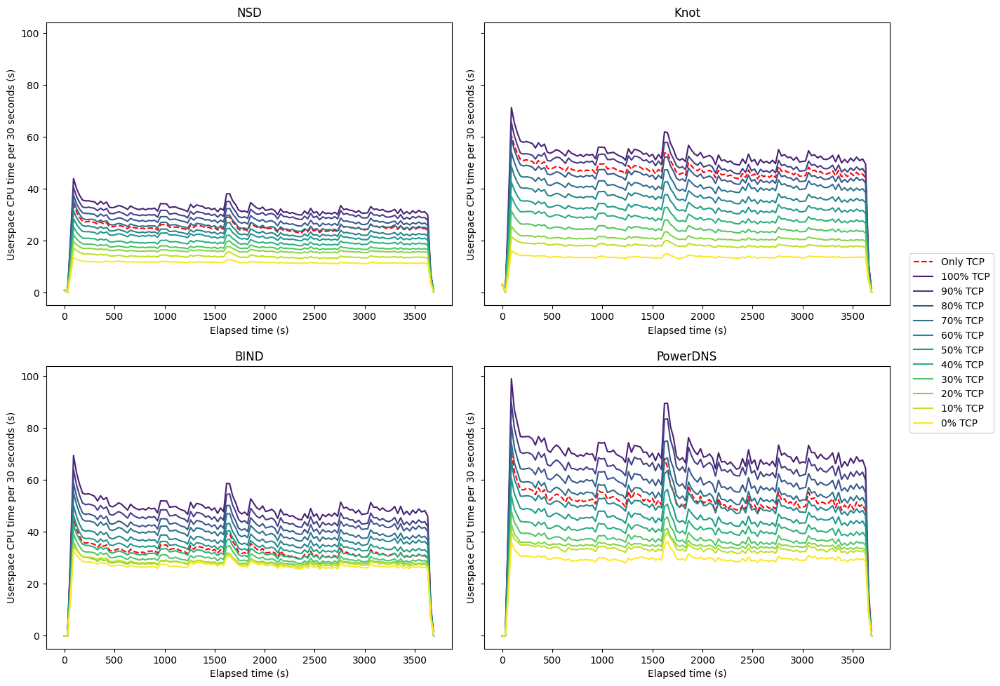

In [10]:
make_cpu_overtime_software_overview(["stats-output/nsd", "stats-output/knot", "stats-output/bind", "stats-output/pdns"])

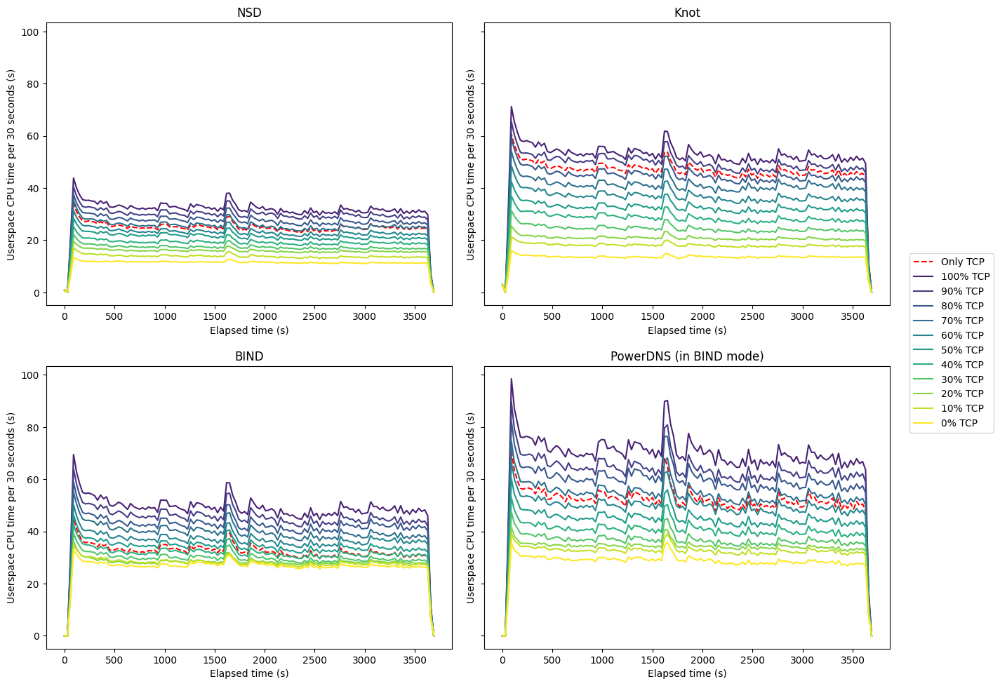

In [25]:
make_cpu_overtime_software_overview(["stats-output/nsd", "stats-output/knot", "stats-output/bind", "stats-output/pdns-new"])

# Plot only the average over time
This plot excludes the moments where the nameserver is not being queried

In [15]:
def calc_avg_over_time(parsed, avgs_cpu, avgs_sys_cpu):
    """
        Calculates the average parsed output from parsed, then calculates 
        over this the average energy consumption within the relevant time interval,
        adds this average value to the avg_cpu list
    """
    avg_cpu, avg_sys_cpu, avg_percentage = average_parsed_output(parsed)
    avg_over_time = sum(avg_cpu[2:-2])/len(avg_cpu[2:-2])
    avg_sys_over_time = sum(avg_sys_cpu[2:-2])/len(avg_sys_cpu[2:-2])
    avgs_cpu.append(avg_over_time)
    avgs_sys_cpu.append(avg_sys_over_time)

    


In [16]:
def make_average_over_time_plot(directory):
    parsed_outputs = make_list_of_outputs(directory)
    avgs_over_time = []
    avgs_sys_over_time = []
    percentages = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
    for output in parsed_outputs:
        if output:
            calc_avg_over_time(output, avgs_over_time, avgs_sys_over_time)
        else:
            percentages = percentages[1:]

    avgs_over_time = list(reversed(avgs_over_time))[:-1]
    avgs_sys_over_time = list(reversed(avgs_sys_over_time))[:-1]


    plt.plot(percentages, avgs_over_time,'-o')
    plt.xlabel("Percentage of queries that retries over TCP")
    plt.ylabel("Userspace CPU time per 30 seconds (s)")
    plt.title("Averaged userspace CPU time vs percentage of TCP retries")
    plt.grid(True)
    plt.savefig('graphs/percentages.svg', bbox_inches="tight")
    plt.show()
    
    plt.plot(percentages, avgs_sys_over_time, '-o')
    plt.xlabel("Percentage of queries that retries over TCP")
    plt.ylabel("Average kernel CPU time per 30 seconds (s)")
    plt.title("Averaged kernel CPU time vs percentage of TCP retries")
    plt.grid(True)
    plt.savefig('graphs/percentages_sys.svg', bbox_inches="tight")
    plt.show()

In [17]:
def make_average_over_time_overview_plot (directories):
    list_of_to_plot_avgs = []
    percentages = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
    for directory in directories:
        parsed_outputs = make_list_of_outputs(directory)

        avgs_over_time = []
        avgs_sys_over_time = []
        for output in parsed_outputs:
            calc_avg_over_time(output, avgs_over_time, avgs_sys_over_time)

        avgs_over_time = list(reversed(avgs_over_time))[:-1]
        avgs_sys_over_time = list(reversed(avgs_sys_over_time))[:-1]

        list_of_to_plot_avgs.append((avgs_over_time, directory.removeprefix("stats-output/")))
    
    fig, axs = plt.subplots(2, 2, sharey=True, figsize=(13, 10))  
    axs = axs.flatten()

    i = 0
    for lines, graph in list_of_to_plot_avgs:
        if graph == 'nsd':
            axs[i].set_title('NSD')
        elif graph == 'knot':
            axs[i].set_title('Knot')
        elif graph == 'bind':
            axs[i].set_title('BIND')
        else:
            axs[i].set_title("PowerDNS (BIND mode)")
        axs[i].grid(True)
        axs[i].set_ylabel("Userspace CPU time per 30 seconds (s)")
        axs[i].set_xlabel("Percentage of queries that retries over TCP")
        axs[i].plot(percentages, lines,'-o')
        i += 1
    # fig.suptitle('Average CPU usage versus TCP percentage for each name server software', fontsize=19)
    plt.tight_layout(pad=1.5)
    # plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for legend
    plt.savefig('graphs/cpu_vs_percentage_overview.svg', bbox_inches="tight")
    plt.show()  
    

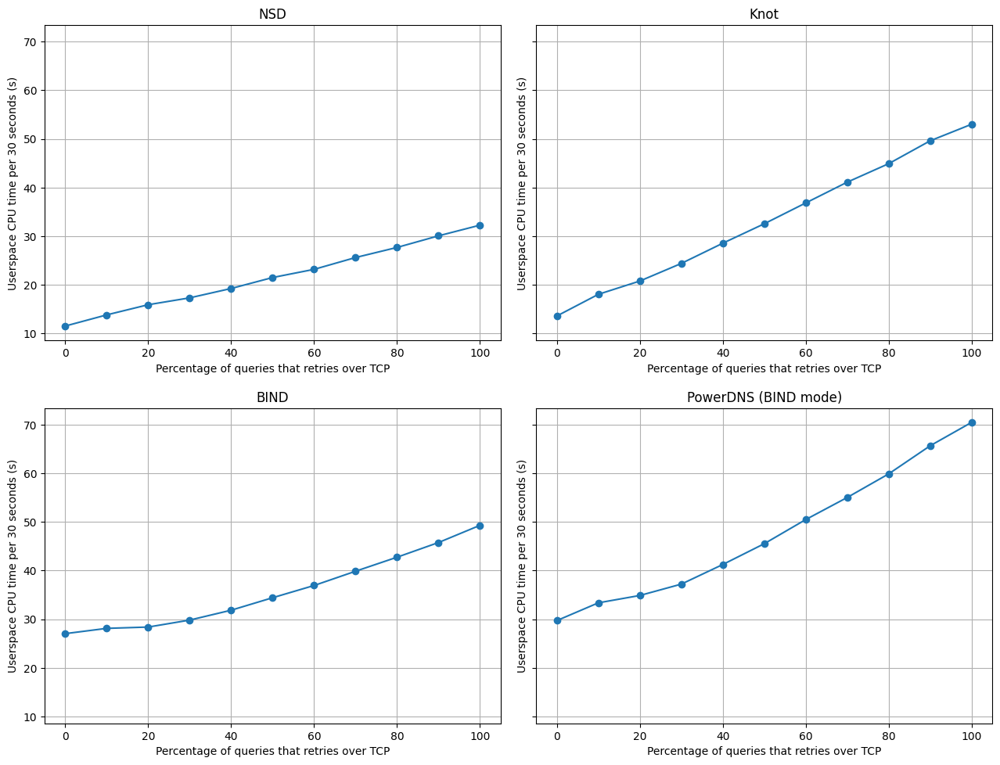

In [51]:
make_average_over_time_overview_plot(["stats-output/nsd", "stats-output/knot", "stats-output/bind", "stats-output/pdns"])

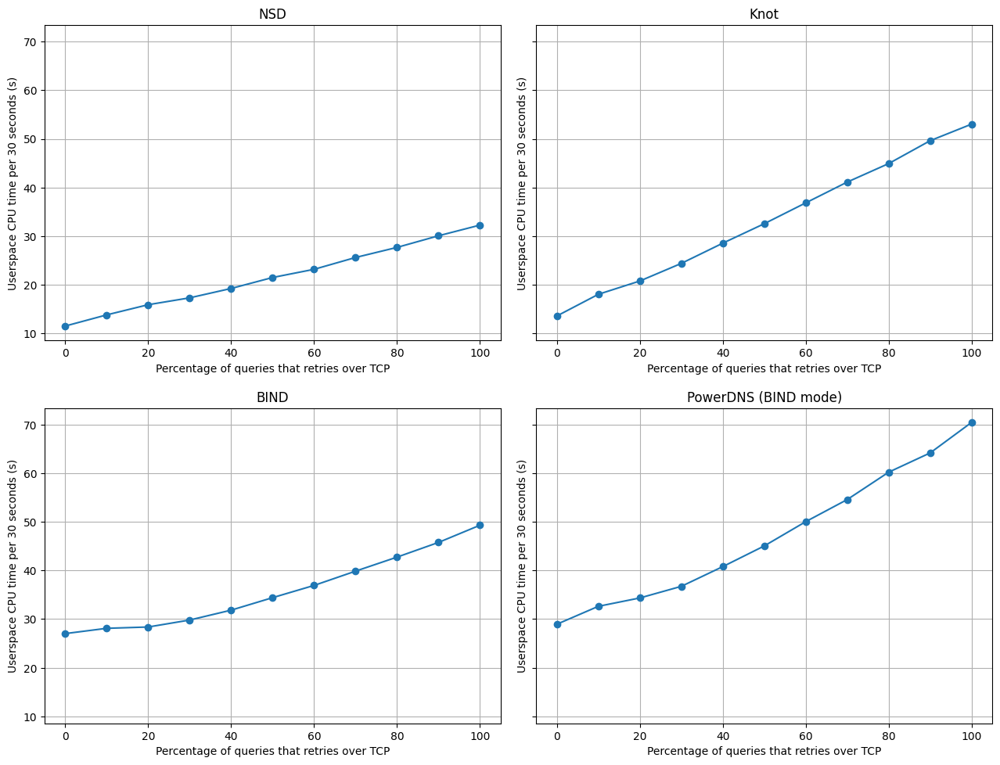

In [18]:
make_average_over_time_overview_plot(["stats-output/nsd", "stats-output/knot", "stats-output/bind", "stats-output/pdns-new"])

In [19]:
number_of_queries = [0, 0, 239888, 210167, 200907, 178446, 186379, 176228, 182530, 176253, 175045, 173104, 182207, 171948, 174998, 161058, 167872, 166088, 173051, 163837, 166096, 156984, 175128, 159015, 165570, 158401, 165840, 158768, 166394, 160480, 163680, 157362, 182215, 170404, 173087, 162502, 170528, 161043, 166037, 160595, 160324, 155289, 176145, 164549, 174367, 166665, 168453, 161708, 166497, 160585, 163897, 155177, 167493, 156495, 211525, 185744, 174958, 163871, 158835, 155474, 159906, 151757, 184994, 165970, 163809, 161691, 168278, 156894, 164323, 160615, 157852, 150765, 164523, 153170, 159925, 150521, 157294, 148055, 152033, 150499, 159468, 151034, 165441, 155737, 153789, 150132, 158977, 151825, 155974, 150040, 157284, 152369, 174635, 159435, 164142, 159202, 160405, 154741, 161443, 152267, 154560, 156100, 171389, 160905, 165780, 157899, 161544, 156623, 159081, 159780, 161276, 153819, 165204, 150513, 158555, 152797, 159322, 155097, 160706, 155141, 157351, 151207, 0, 0]

In [20]:
def get_model_performance_and_line(directory):
    fieldnames = ["30sec_id", "herhaling", "#queries", "%TCP", "CPU_secs"]
    files = os.listdir(directory)
    data = []
    for filename in files:
        if not filename.endswith(".json"): # skip the files that are not json
            continue
        if filename.startswith("110"):
            continue # skip the only TCP measurements
        parsed_output =  get_data_from_stats_json(directory+'/' + filename)
        percentage = filename.split('_')[0]
        match = re.search(r'_(\d+)\.json$', filename)
        repetition = int(match.group(1))
        parsed_output['tcp_percentage'] = percentage
        for i, cpu_moment in enumerate(parsed_output['cpu_nano_diffs']):
            if i != 0 and i != 1 and i != len(parsed_output['cpu_nano_diffs'])-1 and i != len(parsed_output['cpu_nano_diffs'])-2: 
                data.append({'30sec_id': i, 'herhaling': repetition, '#queries': number_of_queries[i], '%TCP': percentage, 'CPU_secs': cpu_moment})
        
    data = pd.DataFrame(data)
    df_rep_mean = (
        data
        .groupby(['%TCP', 'herhaling'], as_index=False)
        .agg(CPU_secs_mean=('CPU_secs', 'mean'))
    )

    X_mean = df_rep_mean['%TCP'].astype(float).values.reshape(-1, 1)
    y_mean = df_rep_mean['CPU_secs_mean'].values

    model_mean = LinearRegression()
    model_mean.fit(X_mean, y_mean)

    # Compare performance
    mean_score = model_mean.score(X_mean, y_mean)
    print(f"Model Performance of {directory.removeprefix("stats-output/")}:")
    print(f"R² = {mean_score:.4f}")
    perc_predict = np.linspace(0,100,100)
    cpu_predict = model_mean.predict(perc_predict.reshape(-1, 1))
    return cpu_predict, model_mean.coef_[0], model_mean.intercept_


In [26]:
def make_overview_with_regression_tcp_vs_cpu_plot(directories):
    list_of_to_plot_avgs = []
    percentages = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
    for directory in directories:
        parsed_outputs = make_list_of_outputs(directory)

        avgs_over_time = []
        avgs_sys_over_time = []
        for output in parsed_outputs:
            calc_avg_over_time(output, avgs_over_time, avgs_sys_over_time)

        avgs_over_time = list(reversed(avgs_over_time))[:-1]
        avgs_sys_over_time = list(reversed(avgs_sys_over_time))[:-1]

        list_of_to_plot_avgs.append((avgs_over_time, directory))
    
    fig, axs = plt.subplots(2, 2, sharey=True, figsize=(13, 10))  
    axs = axs.flatten()

    i = 0
    for lines, graph in list_of_to_plot_avgs:
        name = graph.removeprefix("stats-output/")
        if name == 'nsd':
            axs[i].set_title('NSD')
        elif name == 'knot':
            axs[i].set_title('Knot')
        elif name == 'bind':
            axs[i].set_title('BIND')
        else:
            axs[i].set_title("PowerDNS (in BIND mode)")
        axs[i].grid(True)
        axs[i].set_ylabel("Userspace CPU time per 30 seconds (s)")
        axs[i].set_xlabel("Percentage of queries that retries over TCP")
        axs[i].plot(percentages, lines,'o', color=plt.cm.viridis(0))
        perc_predict = np.linspace(0,100,100)
        cpu_predict, coef, intercept = get_model_performance_and_line(graph)
        axs[i].plot(perc_predict, cpu_predict, color=plt.cm.viridis(0))
        equation = f'y = {coef:.2f}x + {intercept:.2f}'
        axs[i].text(0.5, 10, equation, fontsize=12, color='black')
        i += 1
    # fig.suptitle('Average CPU usage versus TCP percentage for each name server software', fontsize=19)
    plt.tight_layout(pad=1.5)
    # plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for legend
    plt.savefig('graphs/cpu_vs_percentage_overview_regression.svg', bbox_inches="tight")
    plt.show()  
    

Model Performance of nsd:
R² = 0.9961
Model Performance of knot:
R² = 0.9958
Model Performance of bind:
R² = 0.9561
Model Performance of pdns-new:
R² = 0.9783


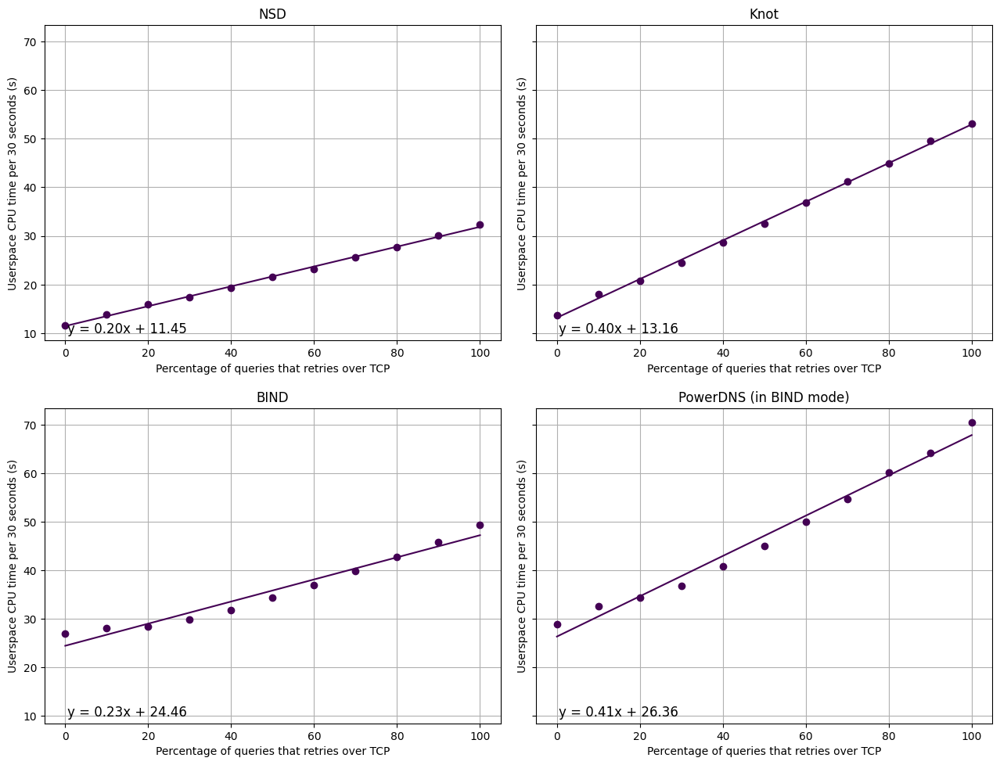

In [27]:
make_overview_with_regression_tcp_vs_cpu_plot(['stats-output/nsd', 'stats-output/knot', 'stats-output/bind', 'stats-output/pdns-new'])

In [19]:
def calc_avg_over_time(parsed, avgs_cpu, avgs_sys_cpu):
    """
        Calculates the average parsed output from parsed, then calculates 
        over this the average energy consumption within the relevant time interval,
        adds this average value to the avg_cpu list
    """
    avg_cpu, avg_sys_cpu, avg_percentage = average_parsed_output(parsed)
    avg_over_time = sum(avg_cpu[2:-2])/len(avg_cpu[2:-2])
    avg_sys_over_time = sum(avg_sys_cpu[2:-2])/len(avg_sys_cpu[2:-2])
    avgs_cpu.append(avg_over_time)
    avgs_sys_cpu.append(avg_sys_over_time)


    cpu_duration_to_average = [d['cpu_nano_diffs'] for d in parsed]
    
    if not all(len(cpu_duration_list) == len(cpu_duration_to_average[0]) for cpu_duration_list in cpu_duration_to_average):
        print("Not all of the lists in the cpu_duration_to_average list of lists are the same length.")
        print([len(cpu_dur_list) for cpu_dur_list in cpu_duration_to_average])
        print("TODO: this needs to be fixed")
        return None
    avg_cpu_duration = [sum(values)/len(values) for values in zip(*cpu_duration_to_average)]

# Checking to see if there is any measurement that is significantly different

In [88]:
def make_measurement_inconsistency_plot(directory):
    parsed_outputs = make_list_of_outputs(directory)

    to_plot_cpu = []
    to_plot_sys_cpu = []
    to_plot_percentage_cpu = []
    colors = plt.cm.viridis(np.linspace(0, 1, len(parsed_outputs)))

    for i, output in enumerate(parsed_outputs):
        if output:
            add_parsed_to_plotter(output, to_plot_cpu, to_plot_sys_cpu, to_plot_percentage_cpu, colors[i])

    fig, axs = plt.subplots(6, 2, figsize=(10, 20))  
    axs = axs.flatten()

    i = 0
    for line in to_plot_cpu:
        if line[2] is not None:
            axs[i].set_title(line[2].removeprefix("Avg for TCP "))
            axs[i].plot(line[0], line[1])
            i += 1
        else:
            axs[i].plot(line[0], line[1])
    fig.suptitle('CPU usage per 30 seconds for each TCP percentage', fontsize=19)
    plt.tight_layout(pad=1.5)
    plt.show()  
 

## Get number of queries per 30 seconds

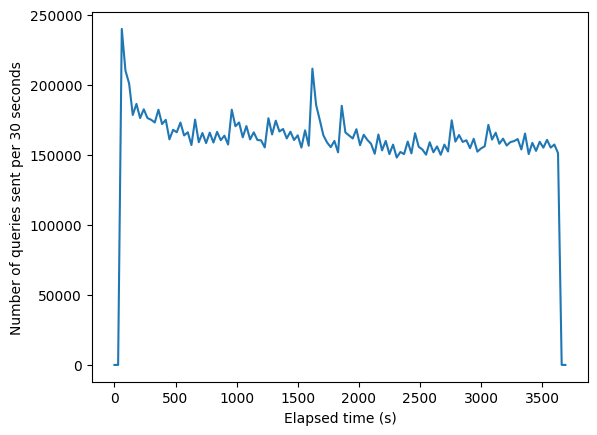

In [62]:
initial_time = 0
timing = [initial_time + i * 30 for i in range(124)]

plt.plot(timing, number_of_queries)
plt.xlabel("Elapsed time (s)")
plt.ylabel("Number of queries sent per 30 seconds")
# plt.title("Number of queries sent over time")
plt.savefig('graphs/number_queries.svg', bbox_inches="tight")
plt.show()


# CPU use per query 

In [ ]:
def make_cpu_per_query_plot(directory, number_of_queries):
    parsed_outputs = make_list_of_outputs(directory)

    to_plot_cpu_avg = []
    to_plot_cpu_sys_avg = []
    to_plot_percentage_cpu_avg = []
    colors = plt.cm.viridis(np.linspace(0, 1, len(parsed_outputs)))

    for i, output in enumerate(parsed_outputs):
        add_avg_parsed_to_plotter(output, to_plot_cpu_avg, to_plot_cpu_sys_avg, to_plot_percentage_cpu_avg, colors[i])

    to_plot_cpu_avg_per_query = []
    for timing, cpu_avg, label, color in to_plot_cpu_avg:
        cpu_avg_per_query = [(cpu_load / number_of_queries[i]) if number_of_queries[i] > 0 else 0 for i, cpu_load in enumerate(cpu_avg)]
        to_plot_cpu_avg_per_query.append((timing, cpu_avg_per_query, label, color))
    make_a_plot(to_plot_cpu_avg_per_query, "Elapsed time (s)", "Userspace CPU time per query per 30 seconds (s/query)", "Average userspace CPU usage per query over time")


# Figures for NSD measurement

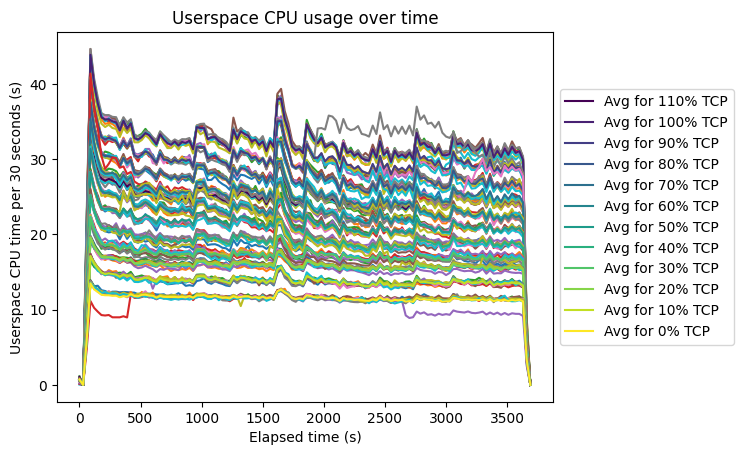

<Figure size 7680x5760 with 0 Axes>

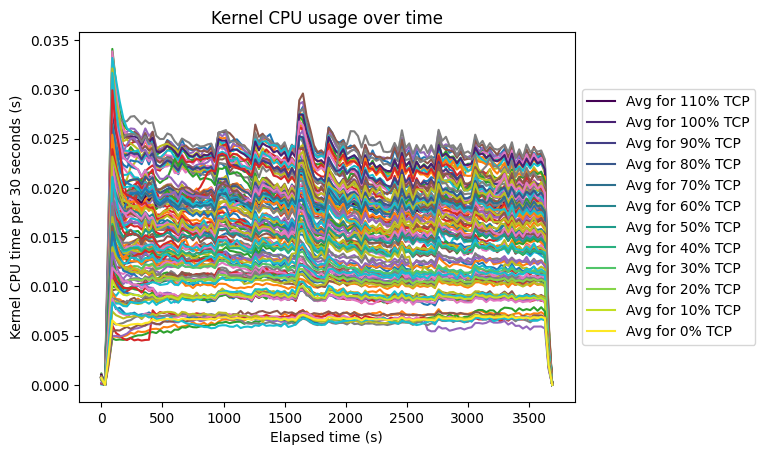

<Figure size 7680x5760 with 0 Axes>

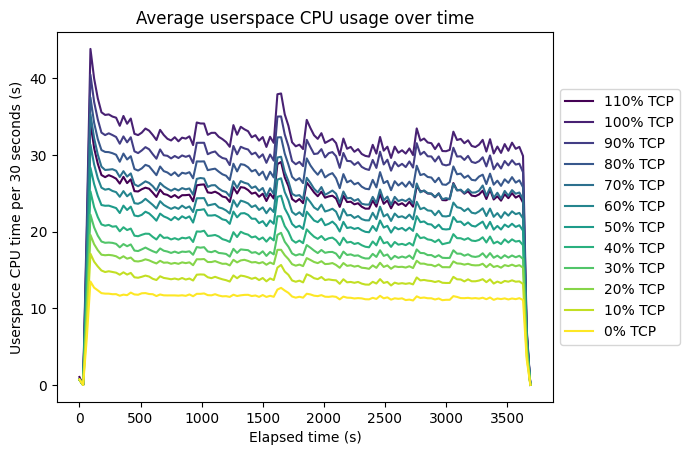

<Figure size 7680x5760 with 0 Axes>

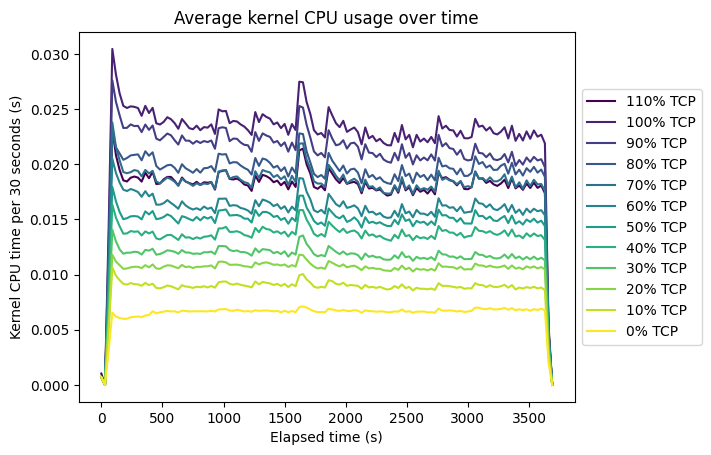

<Figure size 7680x5760 with 0 Axes>

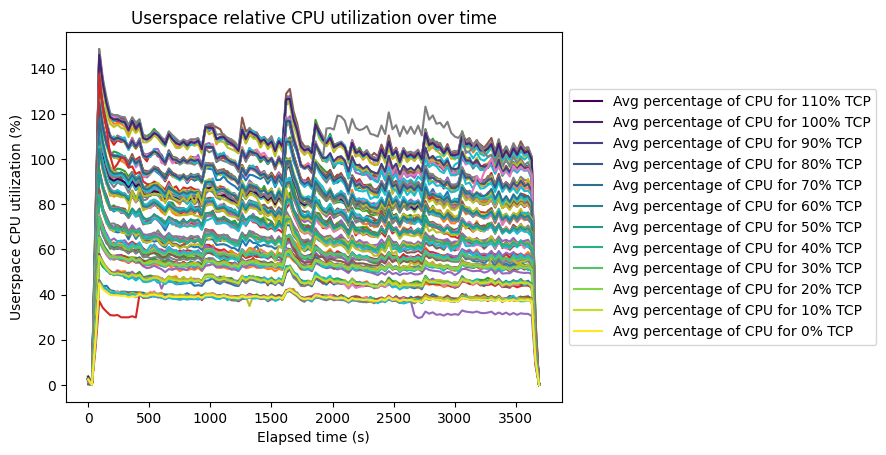

<Figure size 7680x5760 with 0 Axes>

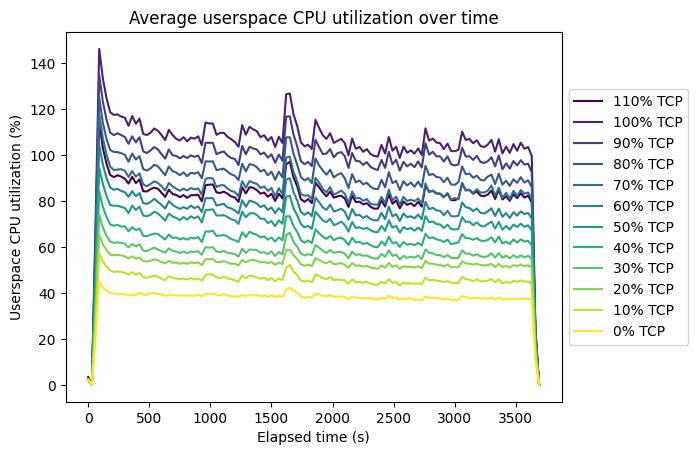

<Figure size 7680x5760 with 0 Axes>

In [78]:
make_cpu_over_time_plots("stats-output/nsd")

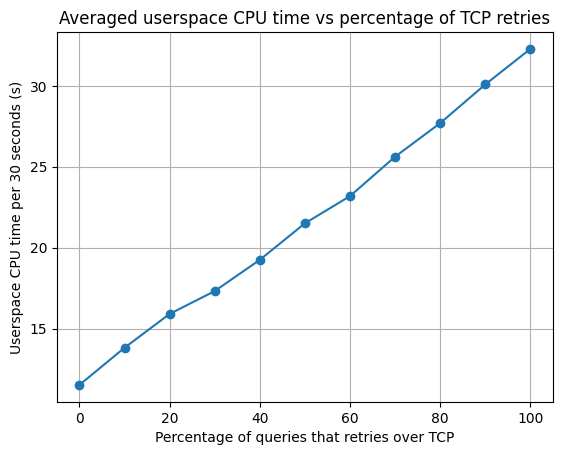

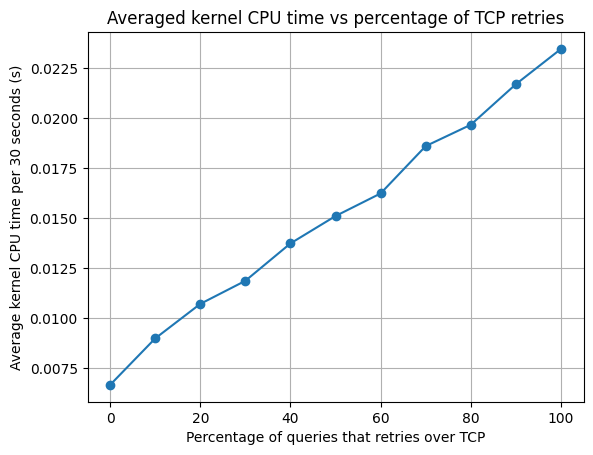

In [24]:
make_average_over_time_plot("stats-output/nsd")

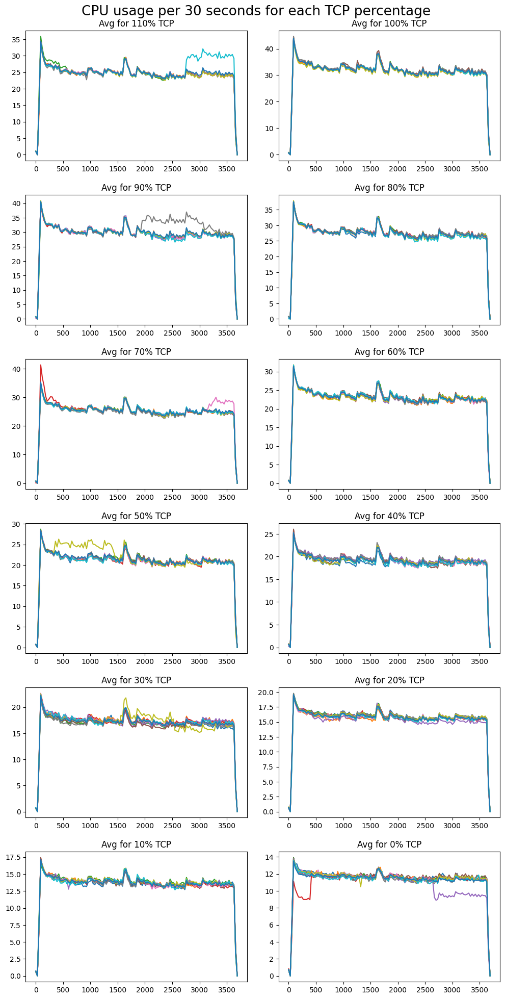

In [89]:
make_measurement_inconsistency_plot("stats-output/nsd")

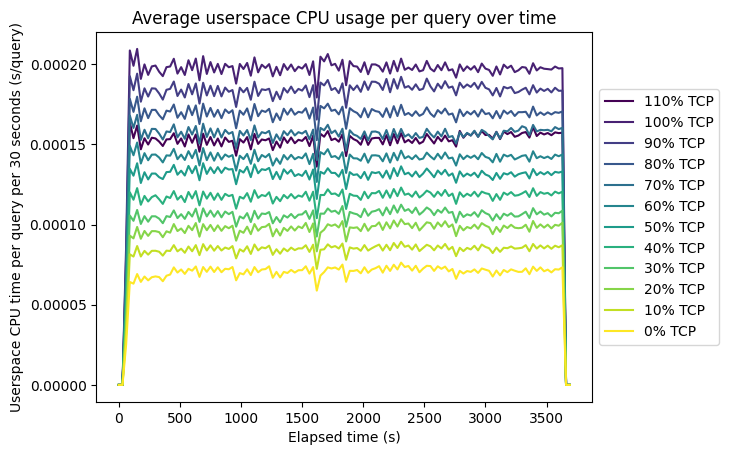

<Figure size 7680x5760 with 0 Axes>

In [ ]:
make_cpu_per_query_plot('stats-output/nsd', number_of_queries)

# Figures for knot measurement

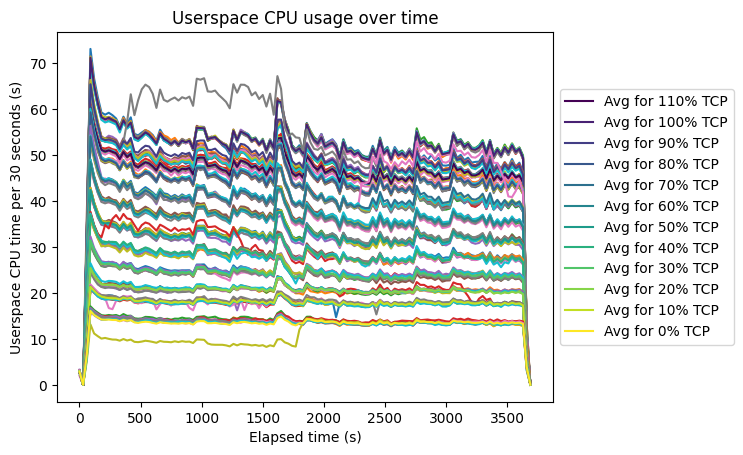

<Figure size 7680x5760 with 0 Axes>

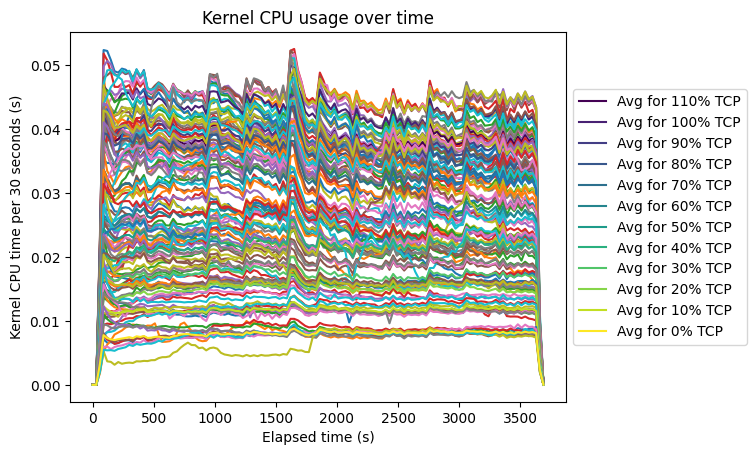

<Figure size 7680x5760 with 0 Axes>

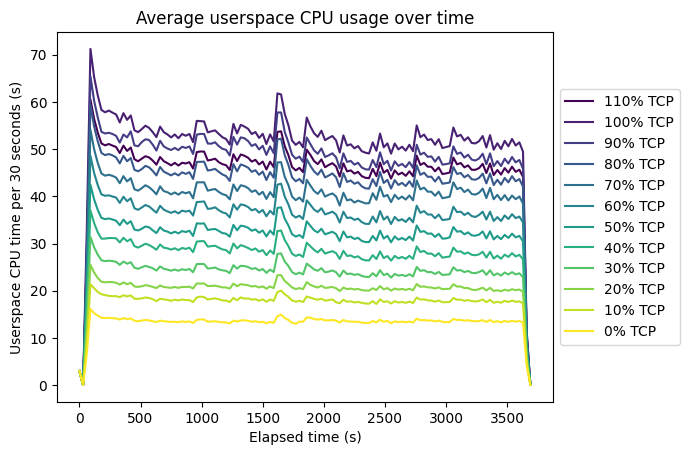

<Figure size 7680x5760 with 0 Axes>

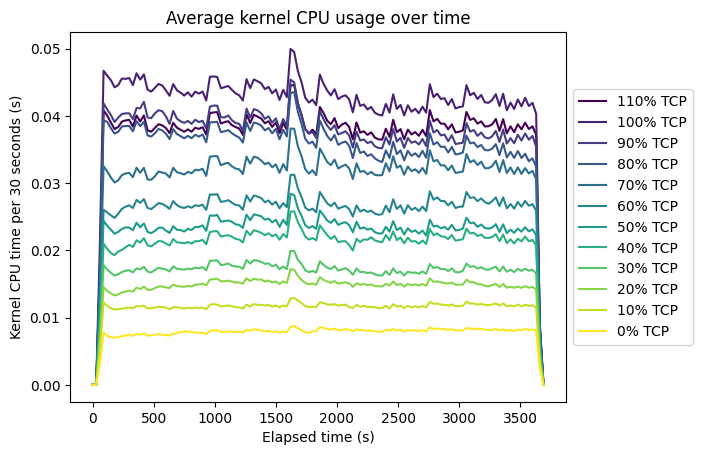

<Figure size 7680x5760 with 0 Axes>

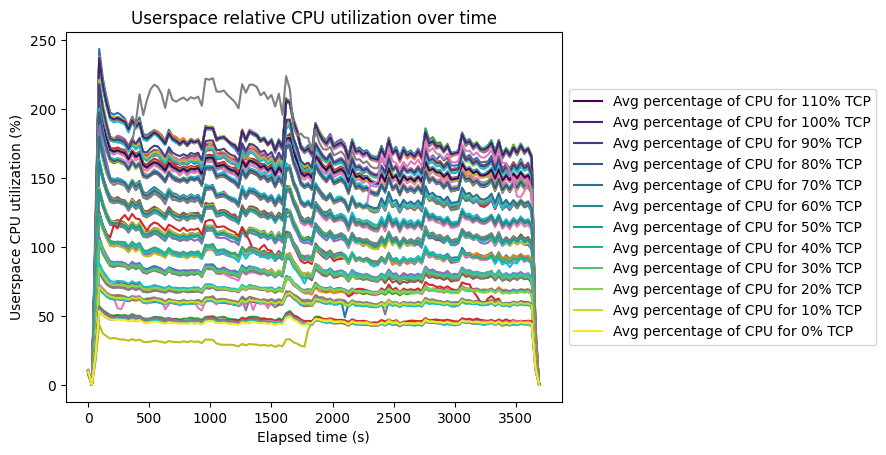

<Figure size 7680x5760 with 0 Axes>

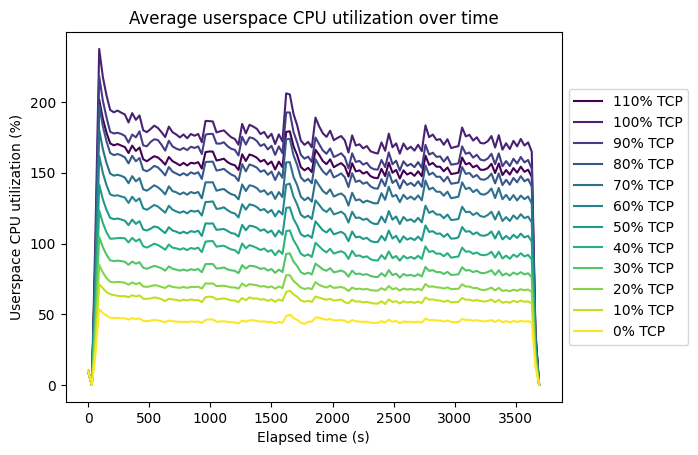

<Figure size 7680x5760 with 0 Axes>

In [37]:
make_cpu_over_time_plots('stats-output/knot/')

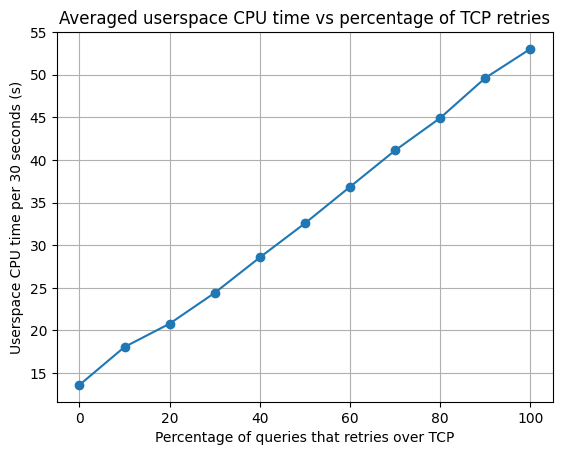

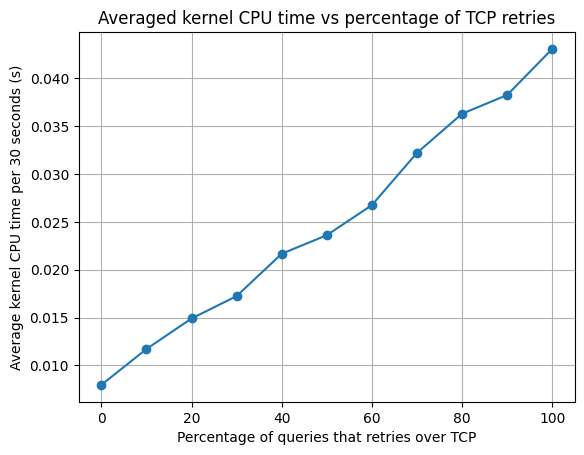

In [38]:
make_average_over_time_plot('stats-output/knot')

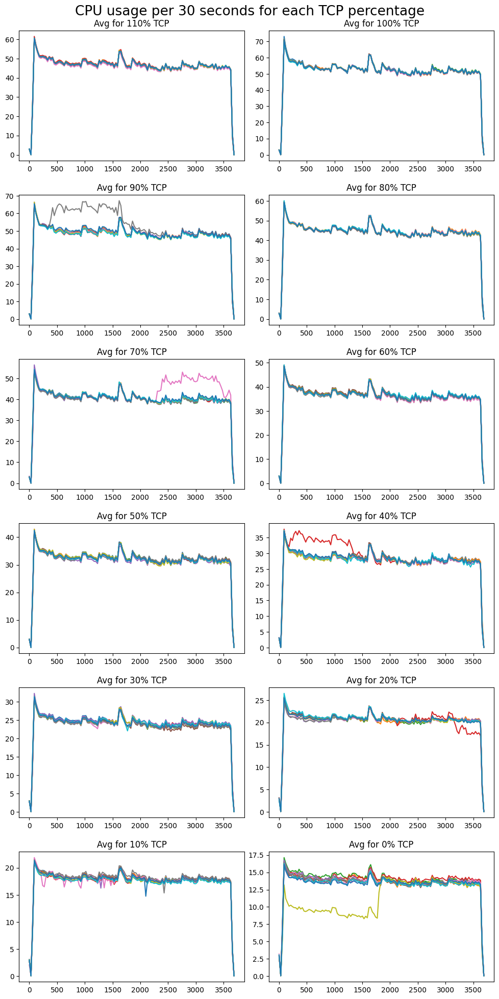

In [39]:
make_measurement_inconsistency_plot('stats-output/knot/')

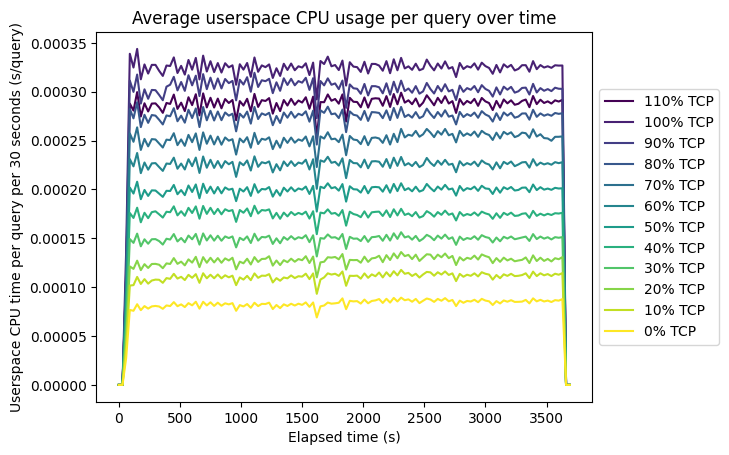

<Figure size 7680x5760 with 0 Axes>

In [40]:
make_cpu_per_query_plot('stats-output/knot', number_of_queries)

# Figures for bind measurements

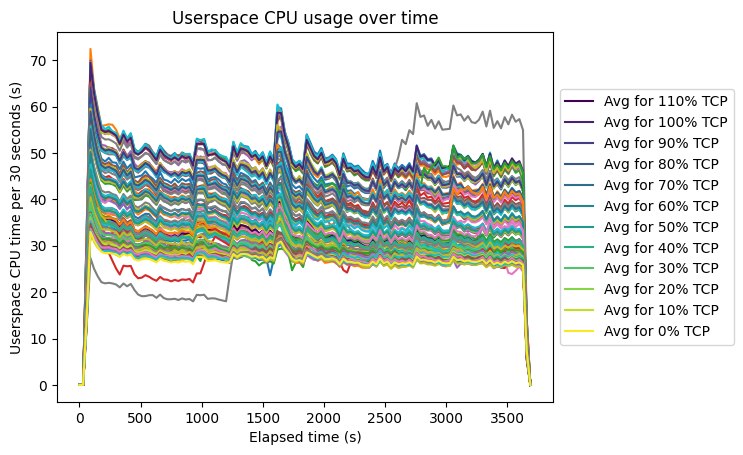

<Figure size 7680x5760 with 0 Axes>

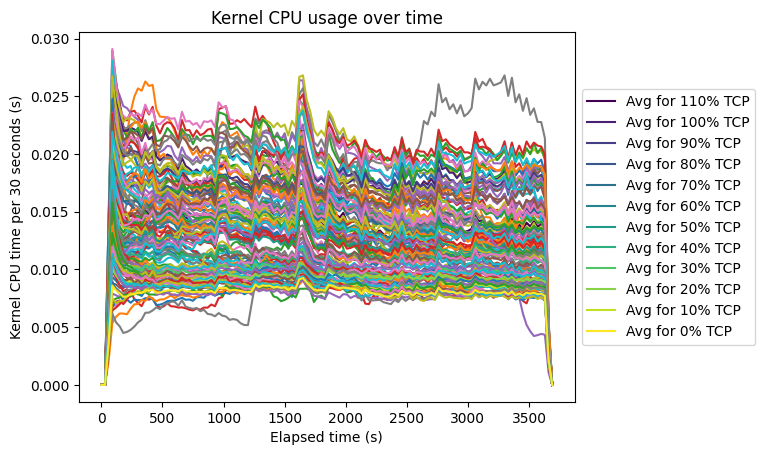

<Figure size 7680x5760 with 0 Axes>

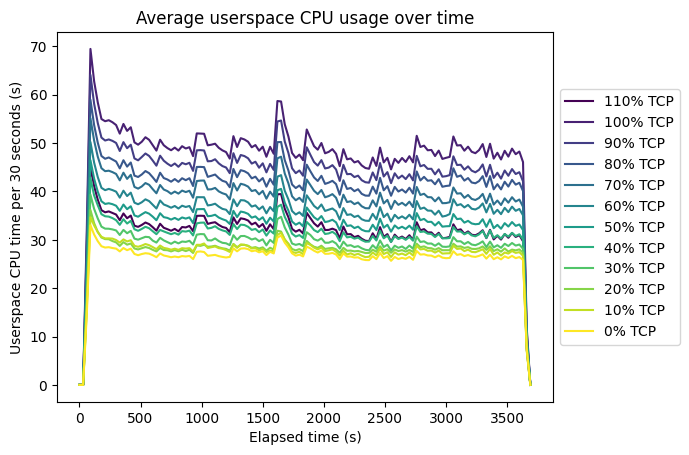

<Figure size 7680x5760 with 0 Axes>

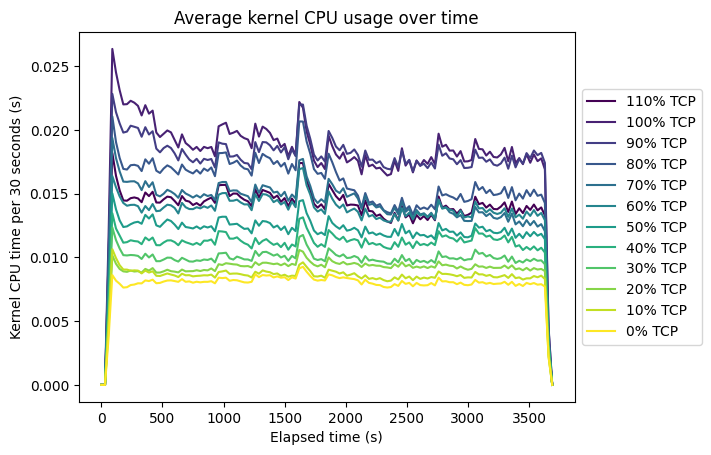

<Figure size 7680x5760 with 0 Axes>

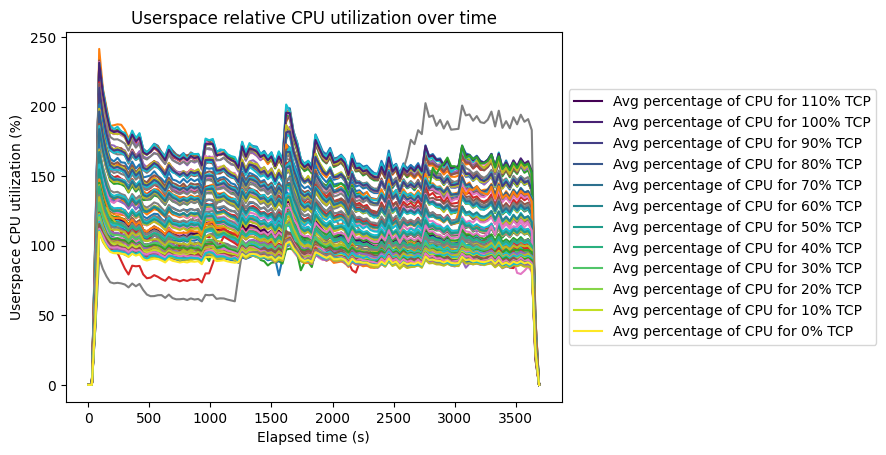

<Figure size 7680x5760 with 0 Axes>

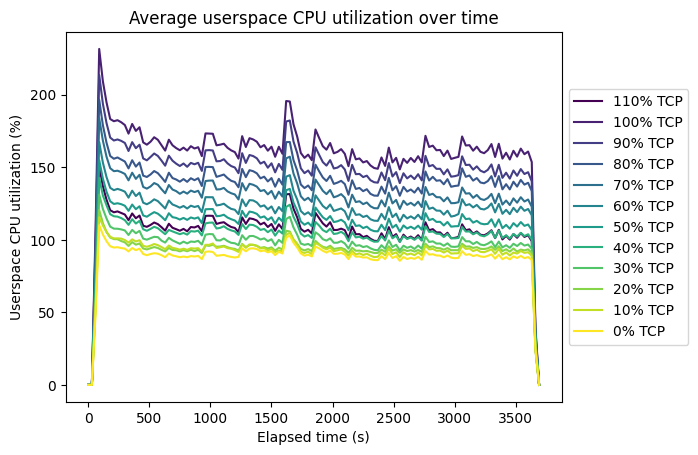

<Figure size 7680x5760 with 0 Axes>

In [41]:
make_cpu_over_time_plots('stats-output/bind/')

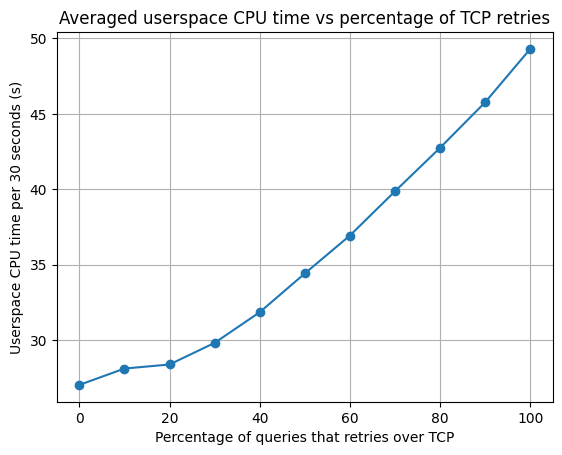

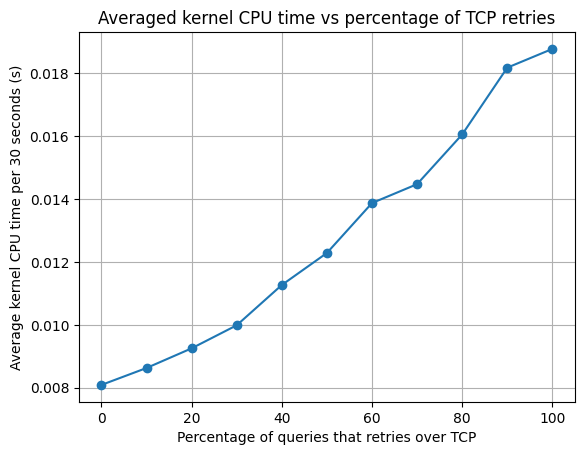

In [42]:
make_average_over_time_plot('stats-output/bind')

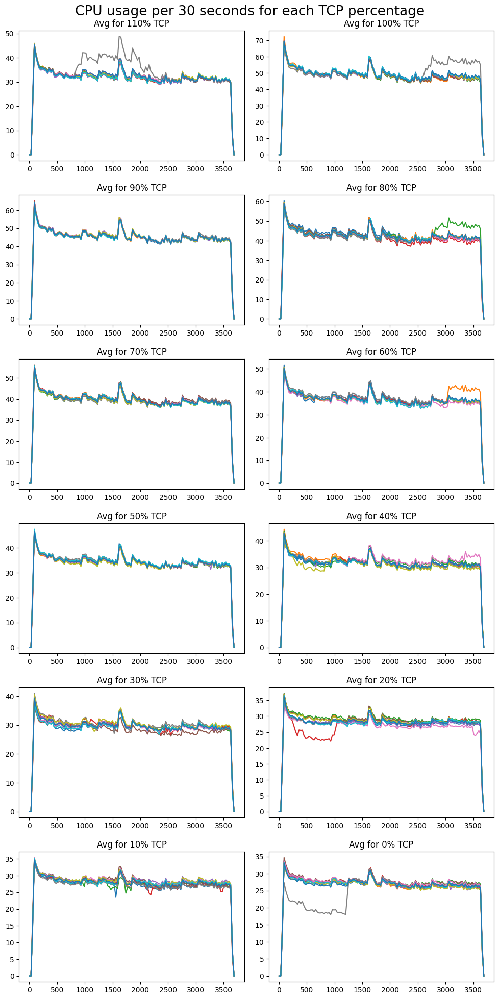

In [43]:
make_measurement_inconsistency_plot('stats-output/bind/')

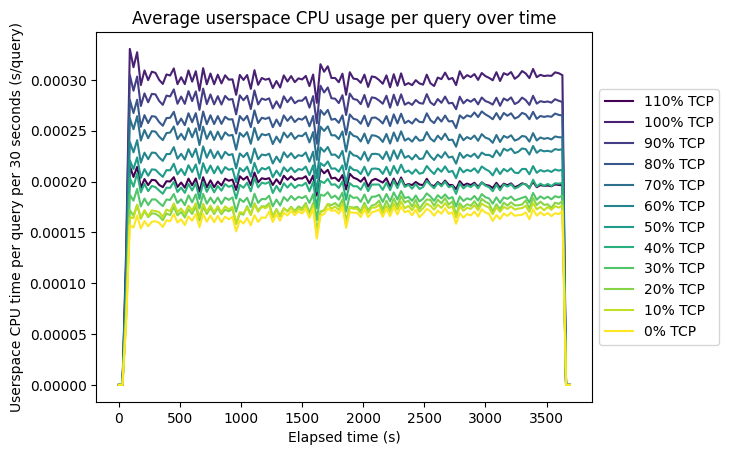

<Figure size 7680x5760 with 0 Axes>

In [44]:
make_cpu_per_query_plot('stats-output/bind', number_of_queries)

# Figures for pdns measurement

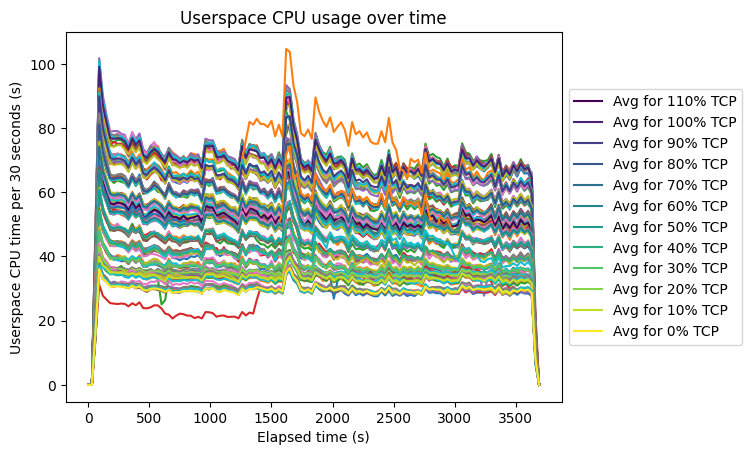

<Figure size 7680x5760 with 0 Axes>

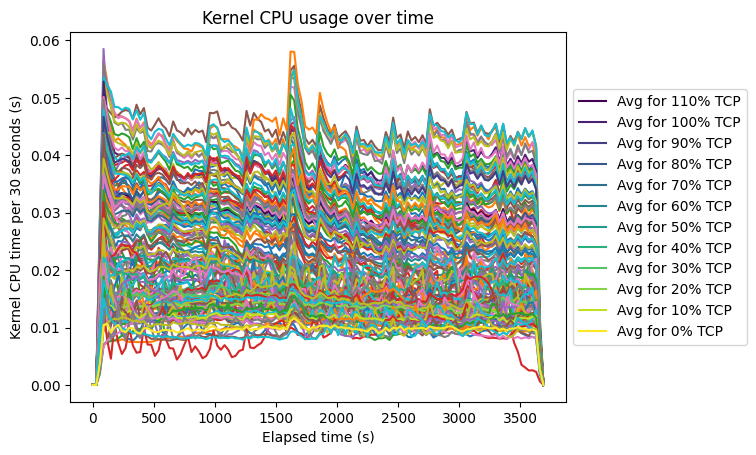

<Figure size 7680x5760 with 0 Axes>

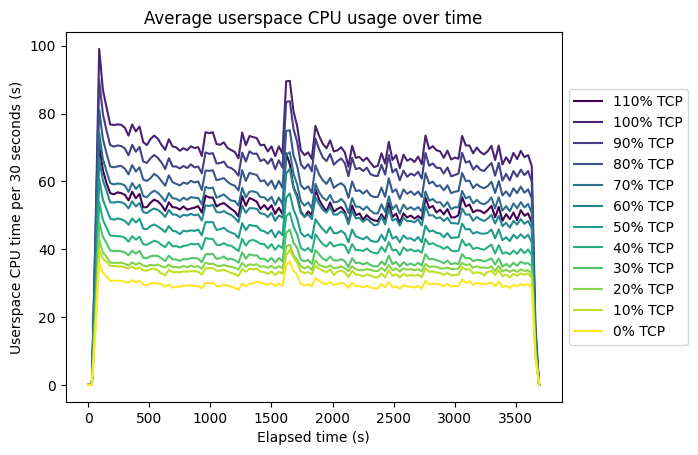

<Figure size 7680x5760 with 0 Axes>

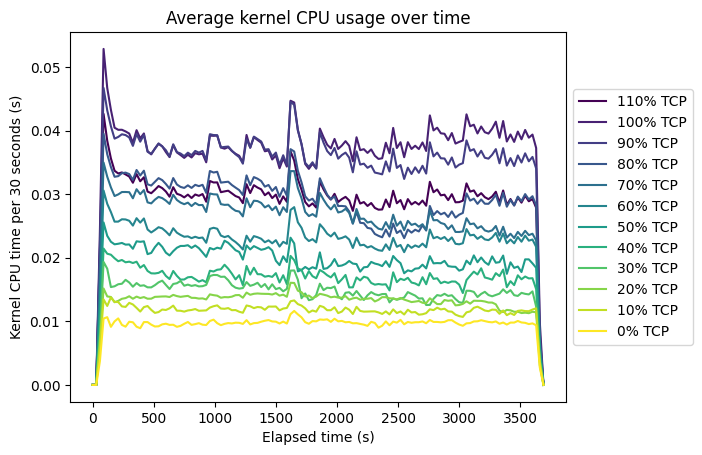

<Figure size 7680x5760 with 0 Axes>

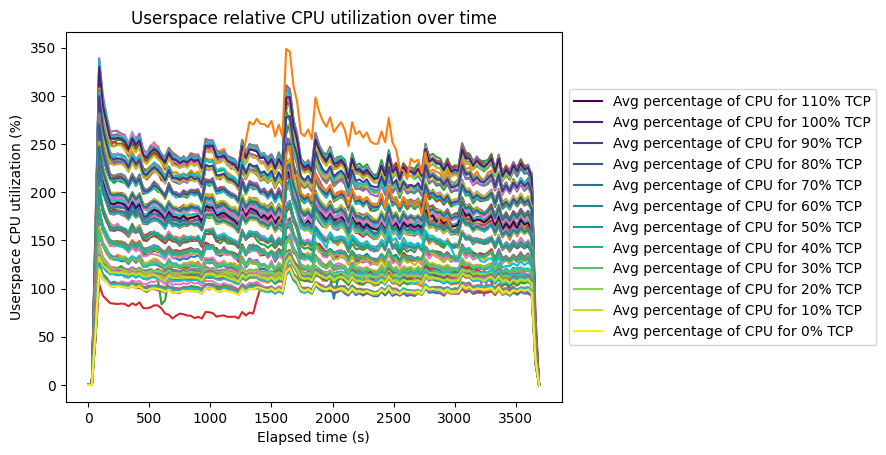

<Figure size 7680x5760 with 0 Axes>

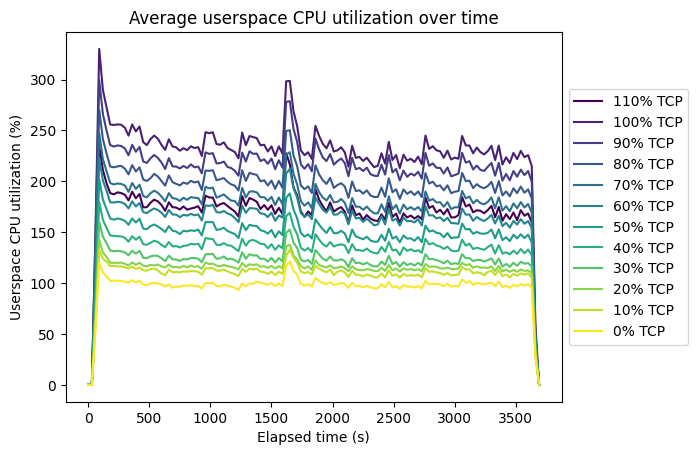

<Figure size 7680x5760 with 0 Axes>

In [45]:
make_cpu_over_time_plots('stats-output/pdns/')

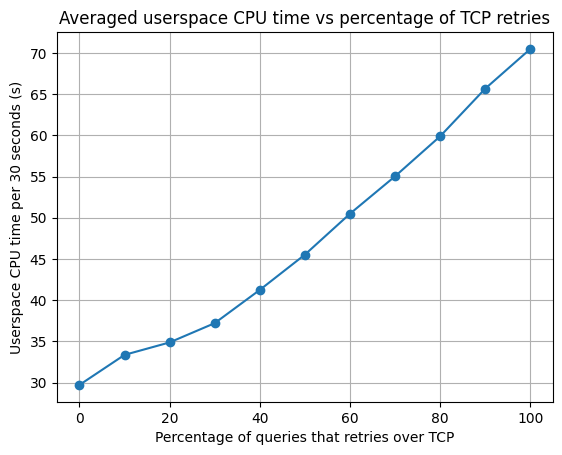

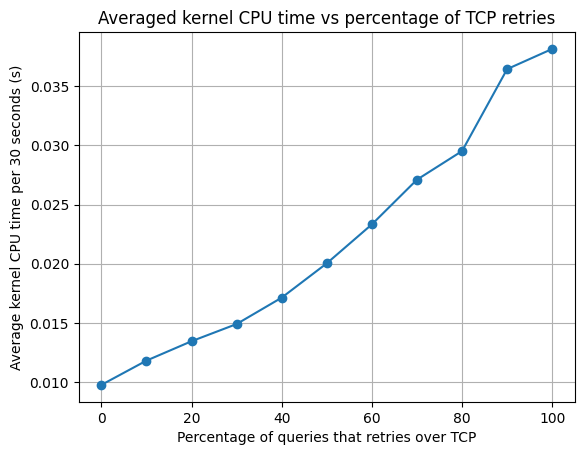

In [46]:
make_average_over_time_plot('stats-output/pdns')

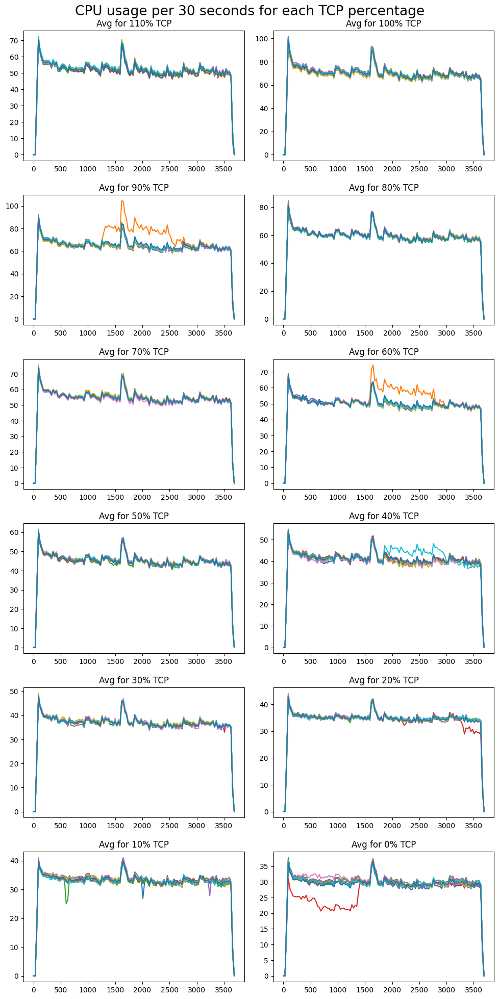

In [47]:
make_measurement_inconsistency_plot('stats-output/pdns/')

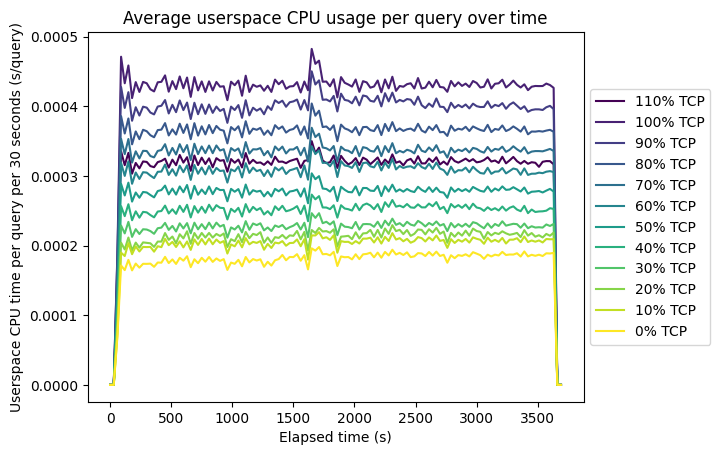

<Figure size 7680x5760 with 0 Axes>

In [48]:
make_cpu_per_query_plot('stats-output/pdns', number_of_queries)